In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
import os
from tensorflow.keras.preprocessing import image

In [32]:
img_path='output/train/Train/'
img_list=os.listdir('output/train/Train/')

In [3]:
import matplotlib.pyplot as plt
import numpy as np

In [33]:
def subplot(img1,img2):
    ax1=plt.subplot(1,2,1)
    ax1.imshow(img1,cmap='gray')
    ax1.title.set_text('Without Masking')
    
    ax2=plt.subplot(1,2,2)
    ax2.imshow(img2,cmap='gray')
    ax2.title.set_text('With Masking')
    
    plt.show()

In [34]:
def mask_image(img):
    img1=img.copy()
    img[img<100/255]=0
    img[img>=75/255]=1
    img=np.abs(img-1)
    subplot(img1,img)
    return img

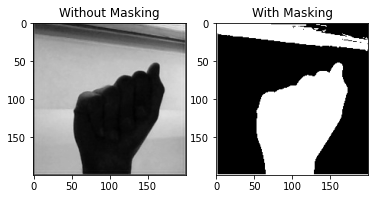

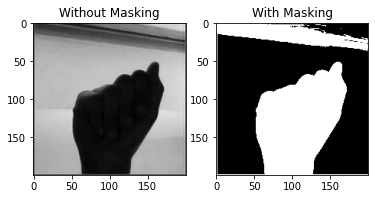

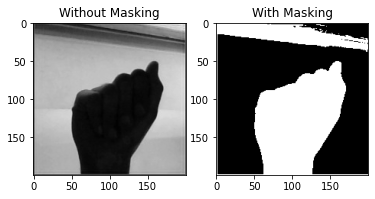

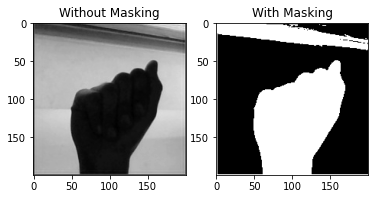

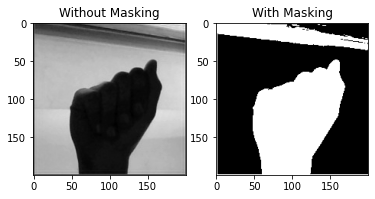

...

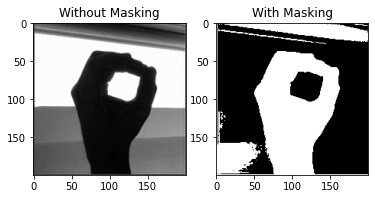

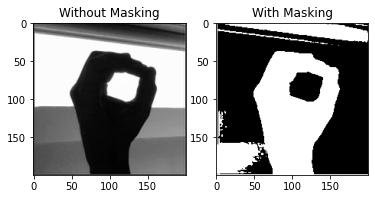

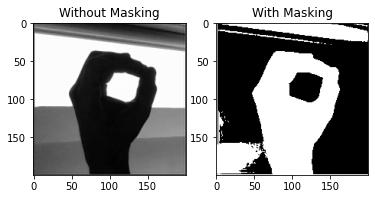

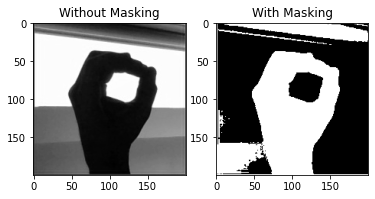

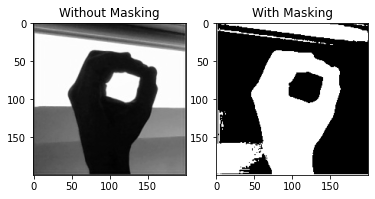

In [35]:
mask_img_tr=[]
for i in img_list:
    img=image.load_img(img_path+i)
    img=image.img_to_array(img)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    img=img/255.0
    mask_img_tr.append(mask_image(img))
    

In [36]:
img=image.load_img(img_path+i)
img=image.img_to_array(img)
img

array([[[  0.,  10., 240.],
        [  0.,   0., 250.],
        [  0.,   0., 254.],
        ...,
        [  5.,   0., 252.],
        [  0.,   0., 253.],
        [  0.,   6., 255.]],

       [[  0.,   0., 254.],
        [  9.,   4., 231.],
        [ 13.,   2., 200.],
        ...,
        [ 17.,   6., 188.],
        [  7.,   5., 203.],
        [  0.,   8., 234.]],

       [[  6.,   0., 251.],
        [ 19.,   3., 200.],
        [103.,  90., 180.],
        ...,
        [169., 160., 207.],
        [170., 167., 255.],
        [  2.,   5., 196.]],

       ...,

       [[  3.,   0., 255.],
        [  8.,   5., 184.],
        [ 81.,  83., 131.],
        ...,
        [149., 137., 113.],
        [141., 131., 192.],
        [ 12.,   7., 185.]],

       [[  0.,   0., 252.],
        [  9.,  11., 208.],
        [ 66.,  68., 177.],
        ...,
        [142., 134., 191.],
        [132., 129., 236.],
        [  6.,   8., 191.]],

       [[  0.,   5., 255.],
        [  0.,   5., 235.],
        [  7.,  

In [37]:
mask_img=np.array(mask_img_tr)

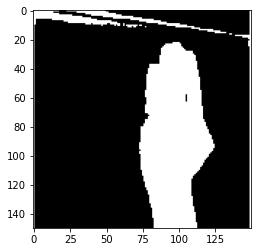

In [38]:
final_mask=np.array(mask_img_tr)

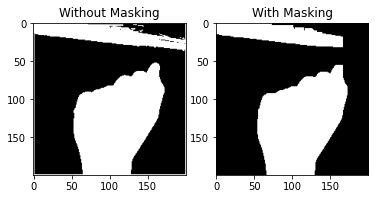

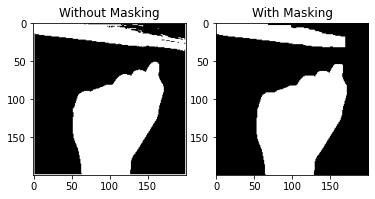

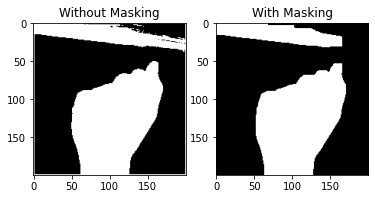

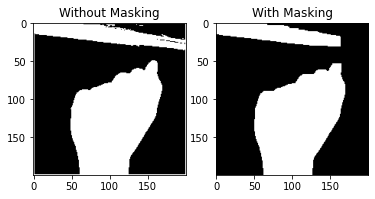

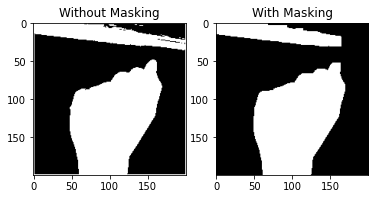

...

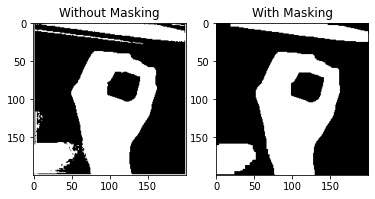

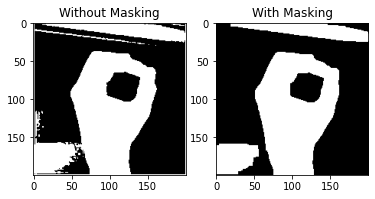

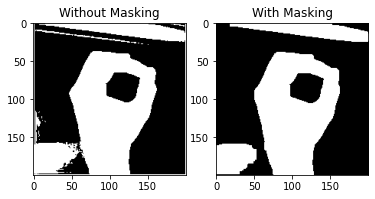

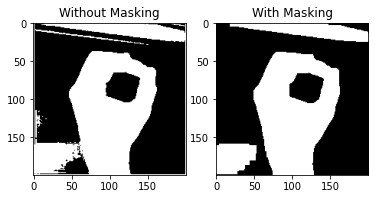

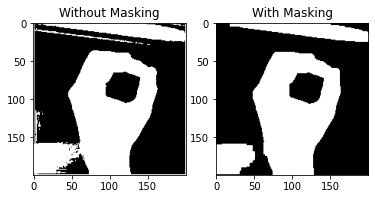

In [39]:
for i in range(len(final_mask)):
    img=final_mask[i]
    se1=cv2.getStructuringElement(cv2.MORPH_RECT,(10,10))
    mask=cv2.morphologyEx(img,cv2.MORPH_OPEN,se1)
    if i<10:
        file_name='output/train/Mask/mask00'+str(i)+'.jpg'
    elif i>=10 and i <100:
        file_name='output/train/Mask/mask0'+str(i)+'.jpg'
    elif i>=100 and i<1000:
        file_name='output/train/Mask/mask'+str(i)+'.jpg'
    
    plt.imsave(file_name,mask)
    subplot(img,mask)
    

In [40]:
val_path='output/val/Val/'
val_list=os.listdir('output/val/Val/')
print(val_list)

['A112.jpg', 'A113.jpg', 'A114.jpg', 'A115.jpg', 'B62.jpg', 'B63.jpg', 'B64.jpg', 'B65.jpg', 'C1.jpg', 'C2.jpg', 'C6.jpg', 'C7.jpg', 'D1.jpg', 'D10.jpg', 'D2.jpg', 'D3.jpg', 'D4.jpg', 'D5.jpg', 'D6.jpg', 'D7.jpg', 'D8.jpg', 'D9.jpg', 'E112.jpg', 'E113.jpg', 'E117.jpg', 'E118.jpg', 'E122.jpg', 'E123.jpg', 'E56.jpg', 'E57.jpg', 'E58.jpg', 'E59.jpg', 'E60.jpg', 'E61.jpg', 'E62.jpg', 'E63.jpg', 'E64.jpg', 'E65.jpg', 'E66.jpg', 'E67.jpg', 'E68.jpg', 'E69.jpg', 'E70.jpg', 'O2906.jpg', 'O2907.jpg', 'O2911.jpg', 'O2912.jpg']


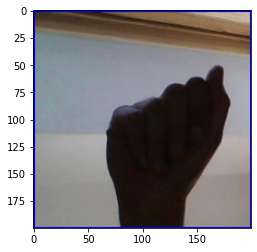

In [41]:
plt.imshow(plt.imread(val_path+val_list[0]))

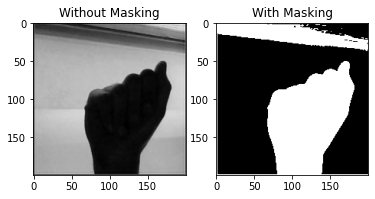

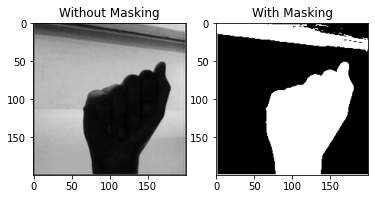

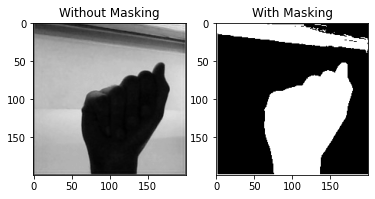

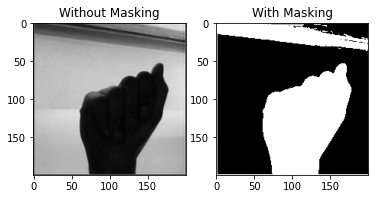

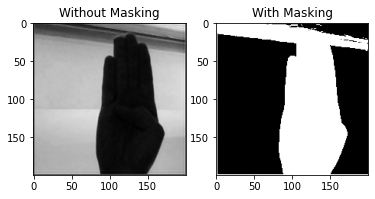

...

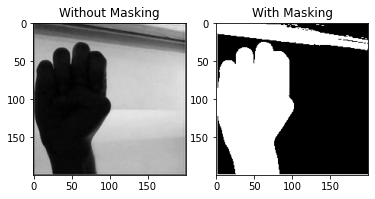

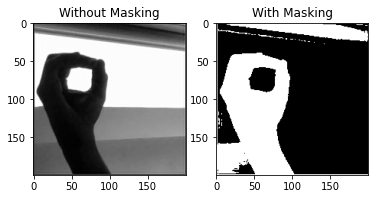

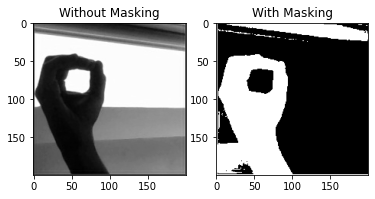

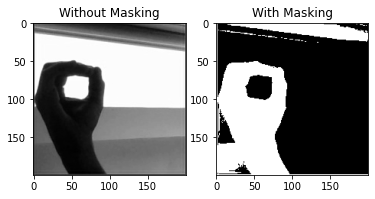

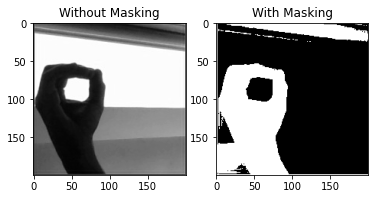

In [42]:
mask_img_val=[]
for i in val_list:
    img=image.load_img(val_path+i)
    img=image.img_to_array(img)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    img=img/255.0
    mask_img_val.append(mask_image(img))

In [43]:
final_mask=np.array(mask_img_val)

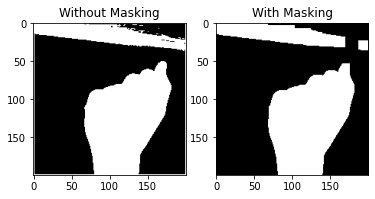

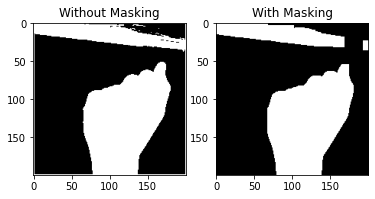

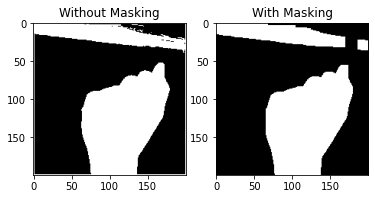

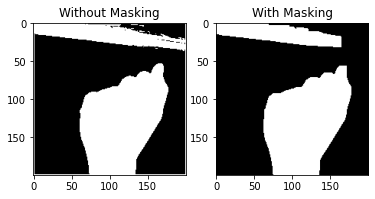

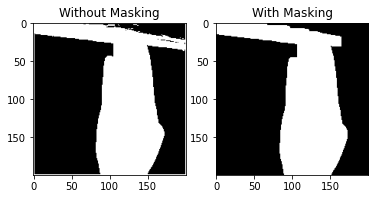

...

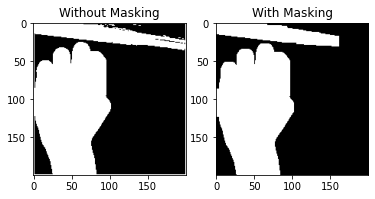

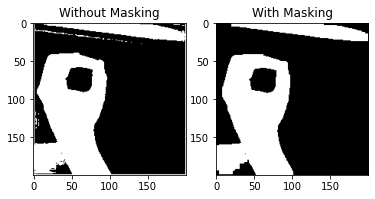

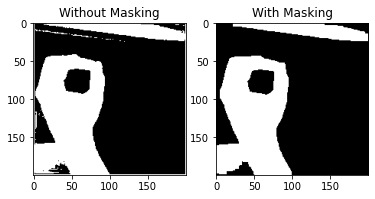

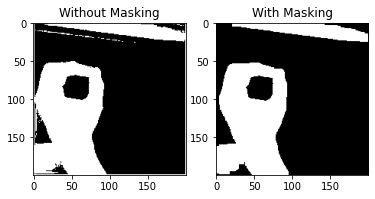

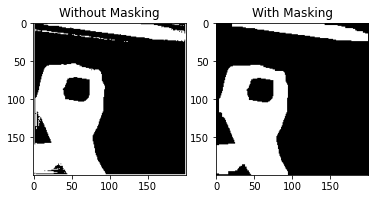

In [47]:
for i in range(len(final_mask)):
    img=final_mask[i]
    se1=cv2.getStructuringElement(cv2.MORPH_RECT,(10,10))
    mask=cv2.morphologyEx(img,cv2.MORPH_OPEN,se1)
    if i<10:
        file_name='output/val/Mask/mask00'+str(i)+'.jpg'
    elif i>=10 and i<100:
        file_name='output/val/Mask/mask0'+str(i)+'.jpg'
    else :
        file_name='output/val/Mask/mask'+str(i)+'.jpg'
    
    plt.imsave(file_name,mask)
    subplot(img,mask)